In [1]:
pip install torch torchvision Pillow

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
import PIL.Image
import tensorflow as tf
import numpy as np

In [3]:
# Utility functions for image processing and visualization
def tensor_to_image(tensor):
    # Convert a TensorFlow tensor to a PIL Image
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img, max_dim):
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img


In [4]:
def vgg_layers(layer_names):
    """Creates a vgg model that returns a list of intermediate output values."""
    # Load our model. Load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.VGG19(include_top=False, weights="imagenet")
    vgg.trainable = False

    outputs = [vgg.get_layer(name).output for name in layer_names]

    model = tf.keras.Model([vgg.input], outputs)
    return model

def gram_matrix(input_tensor):
    result = tf.linalg.einsum("bijc,bijd->bcd", input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / (num_locations)


In [5]:
def style_content_model(style_layers, content_layers):
    vgg = vgg_layers(style_layers + content_layers)
    vgg.trainable = False

    def call(inputs):
        inputs = inputs * 255.0
        preprocessed_input = tf.keras.applications.vgg19.preprocess_input(inputs)
        outputs = vgg(preprocessed_input)
        style_outputs, content_outputs = (
            outputs[: len(style_layers)],
            outputs[len(style_layers) :],
        )

        style_outputs = [gram_matrix(style_output) for style_output in style_outputs]

        content_dict = {
            content_name: value
            for content_name, value in zip(content_layers, content_outputs)
        }

        style_dict = {
            style_name: value
            for style_name, value in zip(style_layers, style_outputs)
        }

        return {"content": content_dict, "style": style_dict}

    return call


In [31]:
def style_transfer_image(
    content,
    style,
    epochs=10,
    steps_per_epoch=100,
    style_weight=1e-2,
    content_weight=1e4,
    total_variation_weight=30,
    max_dim=1000,
    save_name="output.png",
):
    content_img = load_img(content, max_dim=max_dim)
    style_img = load_img(style, max_dim=max_dim)

    content_layers = ["block5_conv2"]

    style_layers = [
        "block1_conv1",
        "block2_conv1",
        "block3_conv1",
        "block4_conv1",
        "block5_conv1",
    ]

    num_content_layers = len(content_layers)
    num_style_layers = len(style_layers)

    extractor = style_content_model(style_layers, content_layers)

    style_targets = extractor(style_img)["style"]
    content_targets = extractor(content_img)["content"]

    image = tf.Variable(content_img)

    def clip_0_1(image):
        return tf.clip_by_value(image, clip_value_min=0.0, clip_value_max=1.0)

    opt = tf.optimizers.Adam(learning_rate=0.02, beta_1=0.99, epsilon=1e-1)

    def style_content_loss(outputs):
        style_outputs = outputs["style"]
        content_outputs = outputs["content"]
        style_loss = tf.add_n(
            [
                tf.reduce_mean((style_outputs[name] - style_targets[name]) ** 2)
                for name in style_outputs.keys()
            ]
        )
        style_loss *= style_weight / num_style_layers

        content_loss = tf.add_n(
            [
                tf.reduce_mean((content_outputs[name] - content_targets[name]) ** 2)
                for name in content_outputs.keys()
            ]
        )
        content_loss *= content_weight / num_content_layers
        loss = style_loss + content_loss
        return loss

    @tf.function()
    def train_step(image):
        with tf.GradientTape() as tape:
            outputs = extractor(image)
            loss = style_content_loss(outputs)
            loss += total_variation_weight * tf.image.total_variation(image)

        grad = tape.gradient(loss, image)
        opt.apply_gradients([(grad, image)])
        image.assign(clip_0_1(image))

    for n in range(epochs):
        print(f"\nEpoch: {n+1}/{epochs}")
        for m in range(steps_per_epoch):
            print(m, " of ", steps_per_epoch, end="\r")
            train_step(image)

        # Return the final stylized image
        stylized_img = tensor_to_image(image)

        # Save the stylized image to the specified file path
        stylized_img.save(f"{save_name}-{n}.png")

    # Return the final stylized image
    return stylized_img

if __name__ == "__main__":
    stylized_image = style_transfer_image(
        "/content/Behind the Hedges.jpg", "/content/Bank of the Oise at Auvers.jpg", save_name="result",
        style_weight=3e-2, content_weight=1e4, total_variation_weight=30,
    )



Epoch: 1/10

Epoch: 2/10

Epoch: 3/10

Epoch: 4/10

Epoch: 5/10

Epoch: 6/10

Epoch: 7/10

Epoch: 8/10

Epoch: 9/10

Epoch: 10/10


In [48]:
from PIL import Image

# Open and display an image
img1,img2,img3 = Image.open('/content/Behind the Hedges.jpg'),Image.open('result-9.png'),Image.open('/content/Bank of the Oise at Auvers.jpg')

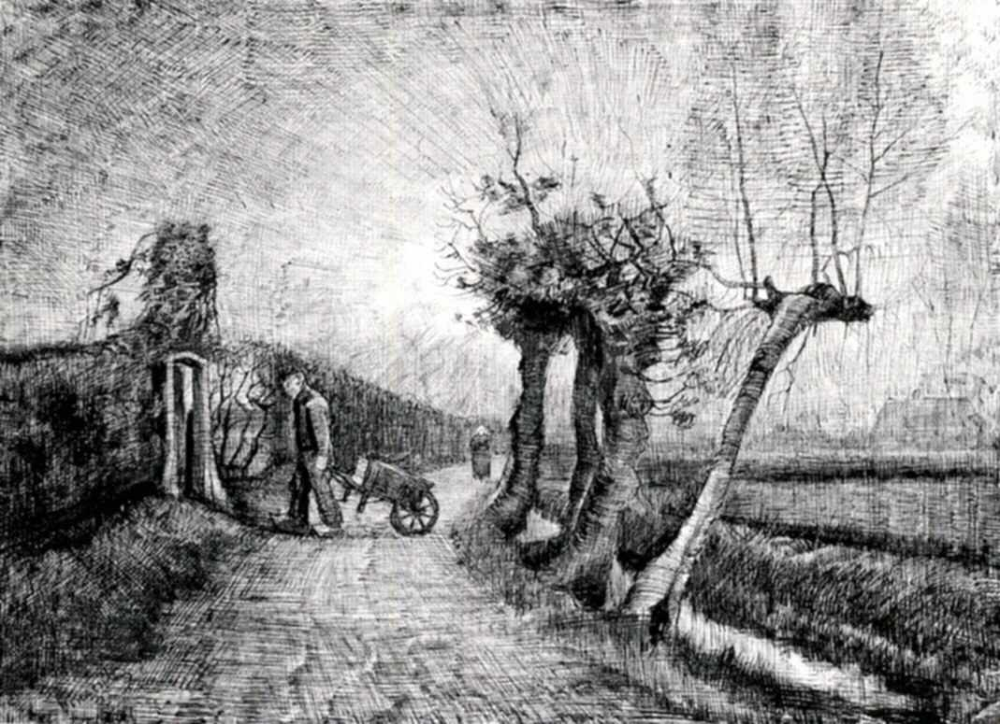

In [49]:
img1

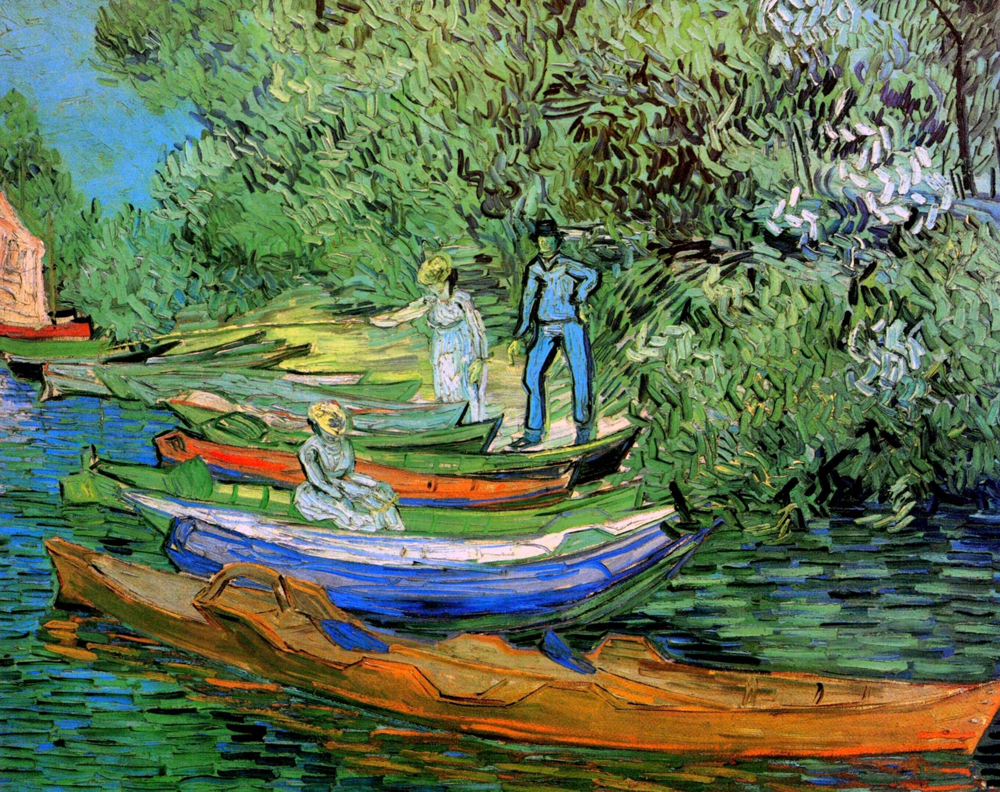

In [50]:
img3

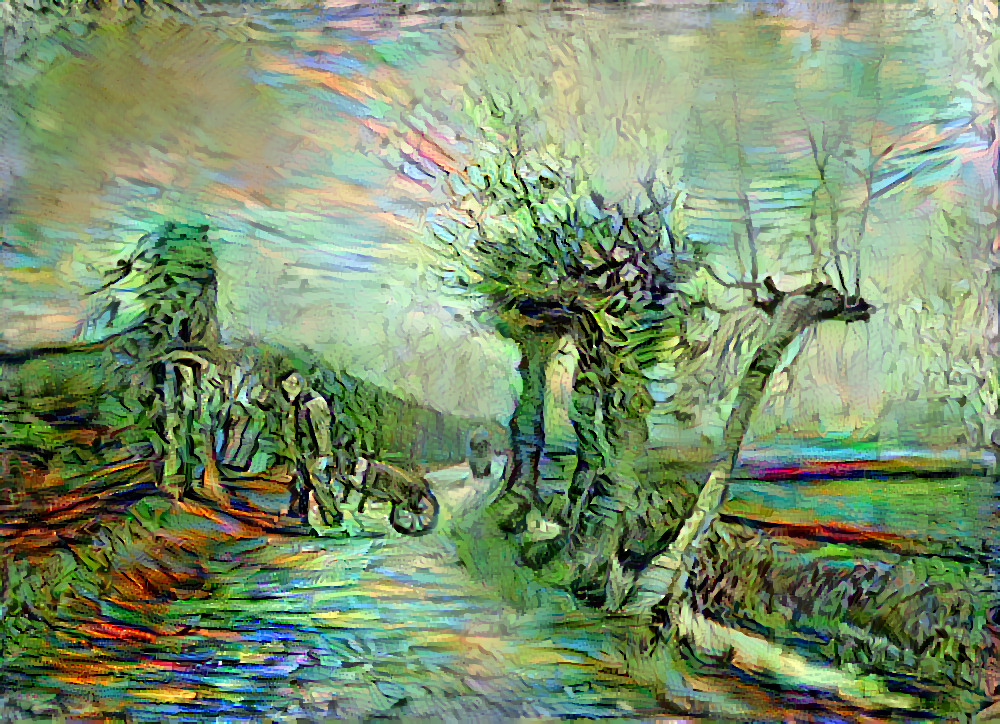

In [34]:
img2